In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sys
sys.path.append('../')
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from data.load import get_data, get_patched_data, get_patched_src, subsample
from data.utils import custom_cutout
from model.metrics import psnr, ssim
from model.losses import *

## Choose Devices

In [2]:
gpu_id = 4
num_cores = 4

In [3]:
torch.cuda.set_device(gpu_id)

In [4]:
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF')  # path to dataset
critic_path = data_pth/f'EM/models/critics'
critic_name = 'critic_patches_resnet_adult_MSE.1g.pkl'
critic = load_learner(path=critic_path, file=critic_name)

# Model

### Feature loss

In [5]:
# loading critic
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF')  # path to dataset
critic_path = data_pth/f'EM/models/critics'
critic_name = 'critic_patches_resnet_adult_MSE.1g.pkl'
critic = load_learner(path=critic_path, file=critic_name)

In [6]:
encoder = critic.model.eval()[0]
layers, layer_ind = pooling_layer(encoder)
act_blocks = previous_layer(layer_ind)
feat_loss = FeatureLoss(m_feat=encoder, layer_ids=act_blocks, layer_wgts=[1/6 for _ in range(6)])

## Initialization

In [7]:
nb_name = 'featureloss-adult-pretrained'
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF/')
lr_path = f'EM/training/trainsets/lr/'
hr_path = f'EM/training/trainsets/hr/'
model_path = data_pth/f'EM/models/feat_loss/'

In [10]:
# loading the 1st round of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)

In [9]:
arch = models.resnet34
wd = 1e-3
superres_metrics = [F.mse_loss, psnr, ssim]
learn = unet_learner(db, arch, wd=wd, 
                         loss_func=feat_loss,
                         metrics=superres_metrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=model_path)
gc.collect()

0

In [10]:
learn.model_dir = model_path
print(learn.model_dir)

/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss


## Exporting to pkl

In [14]:
model_pth = '/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss'
nb_name = 'featureloss-adult-pretrained'
expt_num = '3b'
learn.export(f'{nb_name}.{expt_num}.pkl')

In [15]:
learn = load_learner(path=model_pth ,file=f'{nb_name}.{expt_num}.pkl')

## Load Model (optional)

In [11]:
# learn.model_dir = model_pth
learn = learn.load(f'{nb_name}.2a')

In [12]:
learn

Learner(data=ImageDataBunch;

Train: LabelList (79998 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Valid: LabelList (19999 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel

## Training

In [32]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


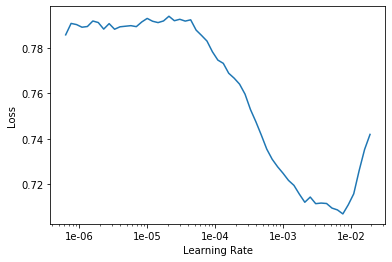

In [33]:
learn.recorder.plot()

### 1a

In [34]:
lr = slice(1e-04, 1e-03)
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.1a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.463726,0.360546,0.039356,22.427801,0.679262,19:30


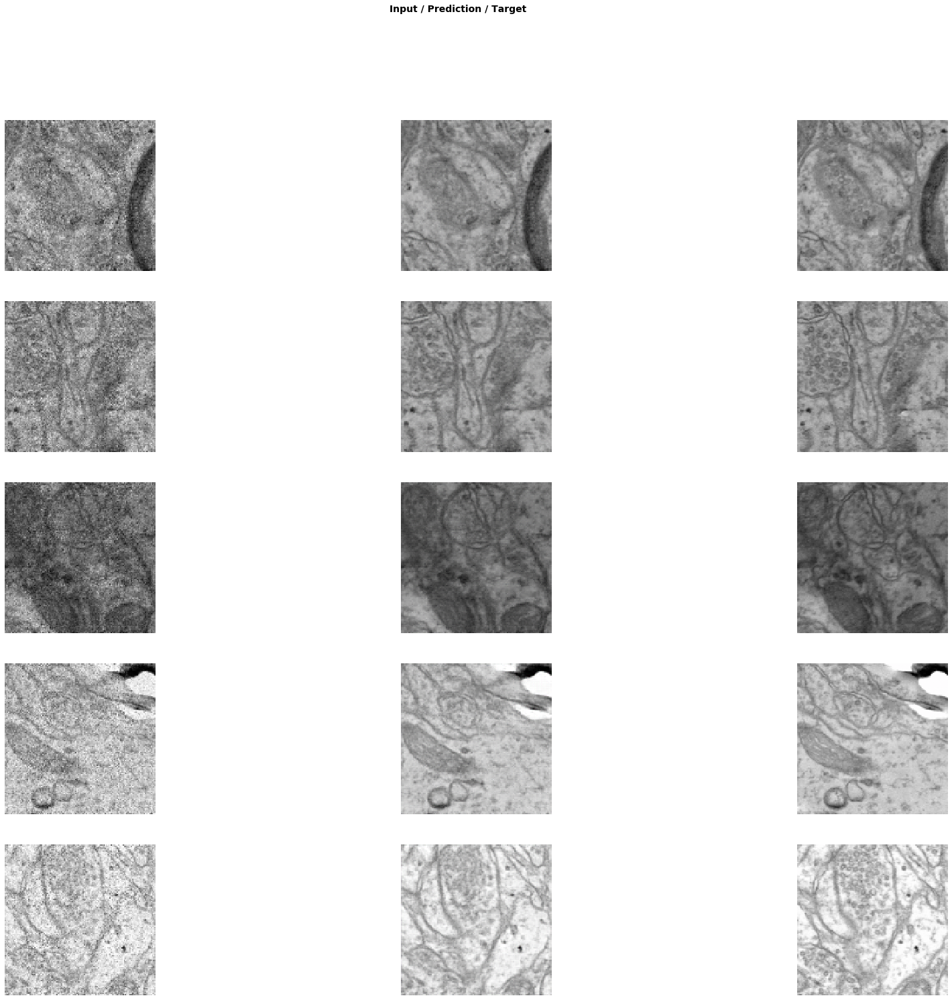

In [35]:
learn.show_results(rows=5, figsize=(30,24))

### 1b

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


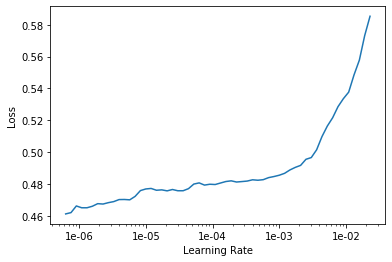

In [42]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [44]:
lr = 1e-6
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.472843,0.359832,0.039179,22.447460,0.679527,26:55
1,0.467718,0.359604,0.039170,22.448460,0.679595,18:20
2,0.470306,0.359667,0.039207,22.444378,0.679538,18:18


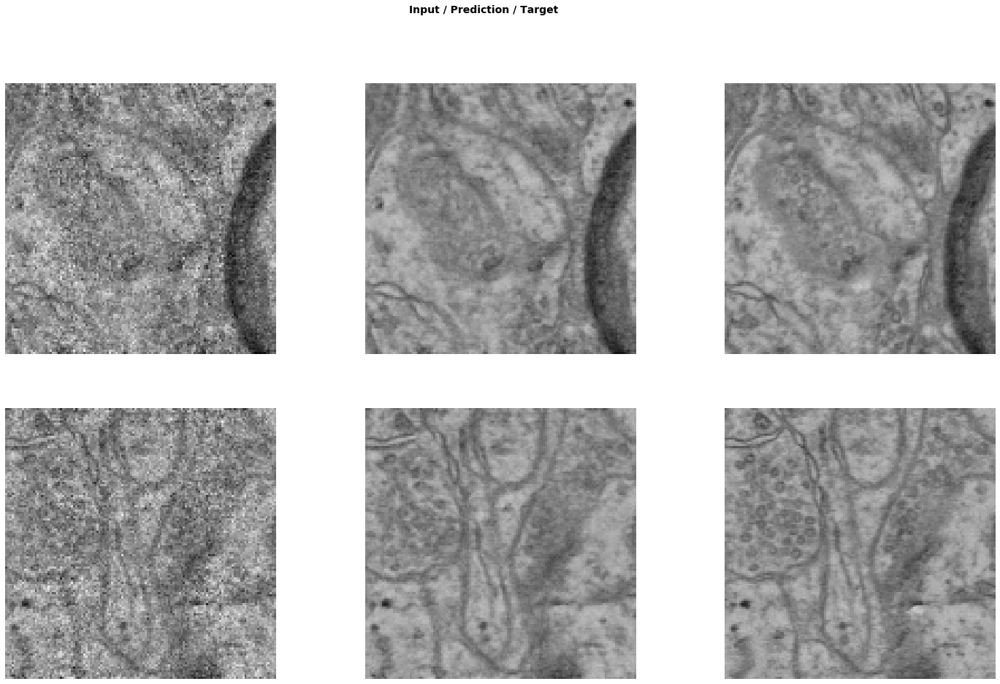

In [45]:
learn.show_results(rows=2, figsize=(25, 15))

## 2a

In [8]:
# 2nd round of data
bs_2 = 32
size_2 = 256
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_2, in_sz=size_2, out_sz=size_2, max_zoom=3)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


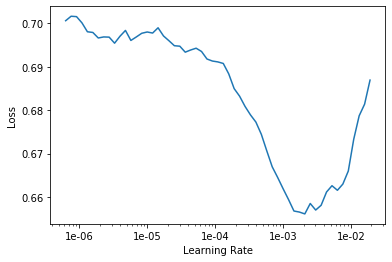

In [46]:
learn.data = db
learn.freeze()
learn.lr_find()
learn.recorder.plot()

In [47]:
lr = slice(3e-4, 1e-03)
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.2a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.447636,0.381593,0.049653,21.420465,0.491590,27:36


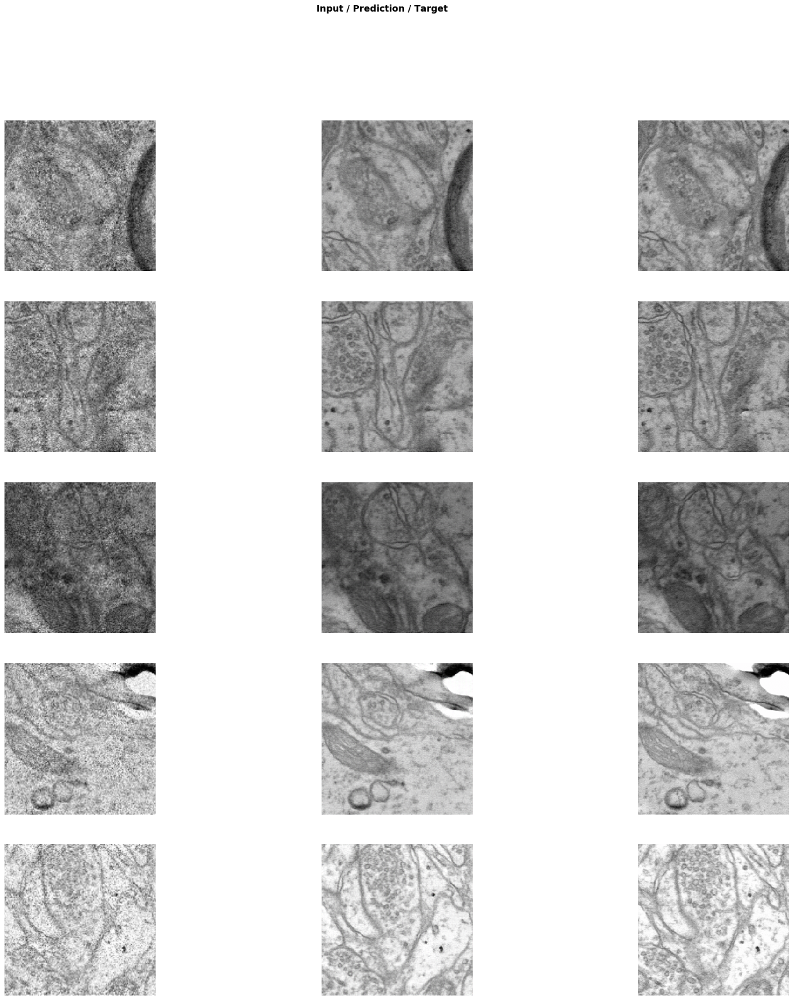

In [ ]:
learn.show_results(rows=5, figsize=(25, 25))

## 2b

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


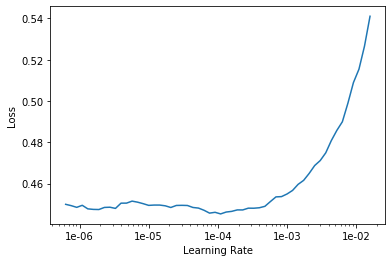

In [13]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [14]:
lr = slice(1e-6, 1e-5)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.449345,0.381486,0.049571,21.427692,0.491533,28:49
1,0.449233,0.380987,0.049673,21.418739,0.491347,27:34
2,0.444605,0.380771,0.049724,21.414276,0.491941,27:36


In [15]:
learn = learn.load(f'{nb_name}.2b')
learn.validate()

[0.38077128, tensor(0.0497), tensor(21.4143), tensor(0.4919)]

In [20]:
learn.load(f"emsynth_005_unet.5")
learn.validate()

[1.6133391, tensor(0.0591), tensor(20.6605), tensor(0.4628)]

## 3a

In [8]:
# 3rd round of data
bs_3 = 8
size_3 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_3, in_sz=size_3, out_sz=size_3, max_zoom=2.)

In [16]:
learn.data = db

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


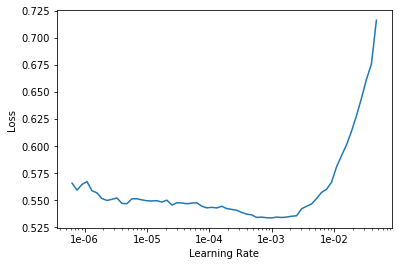

In [23]:
learn.data = db
learn.freeze()
learn.lr_find()
learn.recorder.plot()

In [24]:
lr = slice(1e-4, 1e-03)
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.3a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.420057,0.417850,0.066722,20.058249,0.269399,1:50:31


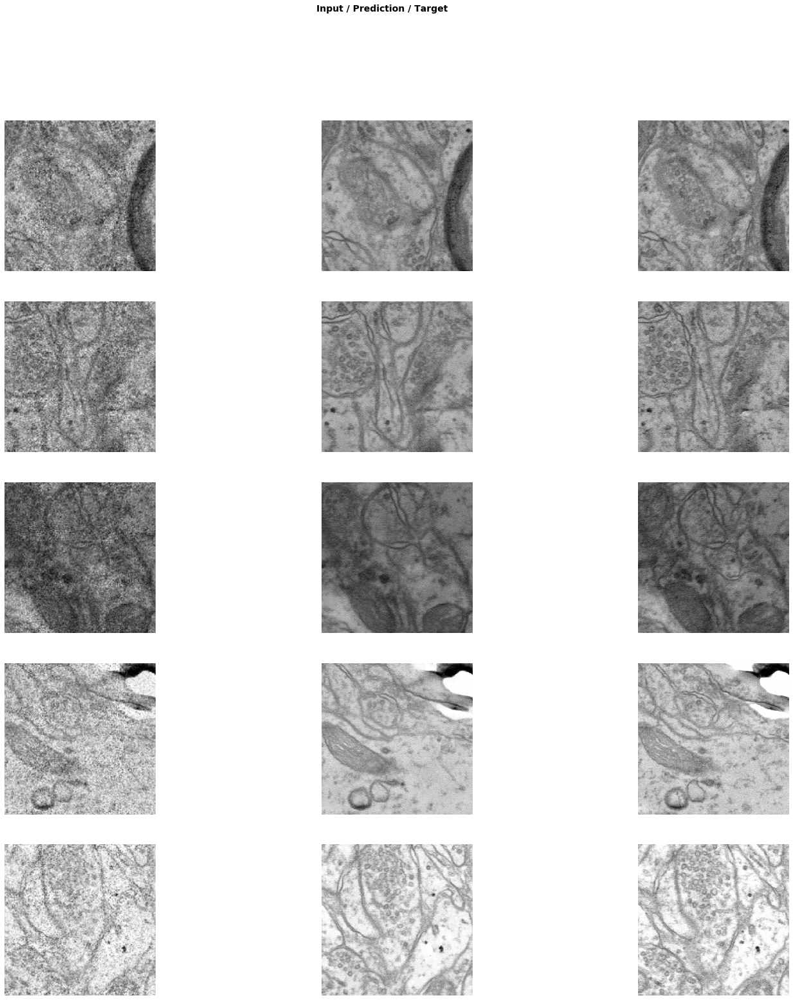

In [25]:
learn.show_results(rows=5, figsize=(25, 25))

### 3b

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


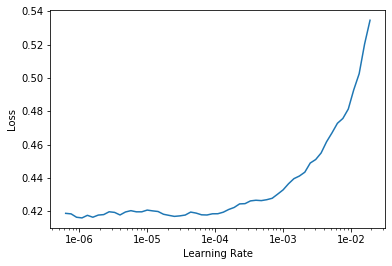

In [26]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [27]:
lr = slice(3e-5, 3e-4)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.426435,0.426708,0.065101,20.164616,0.266071,1:55:12
1,0.413244,0.420298,0.064733,20.189140,0.275531,1:55:22
2,0.411806,0.411409,0.065563,20.134636,0.274540,1:55:21


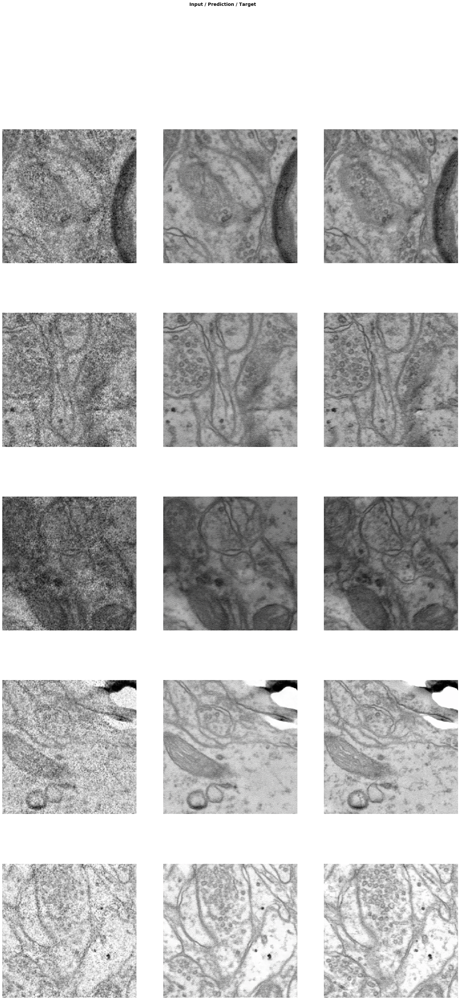

In [28]:
learn.show_results(rows=5, figsize=(25, int(25*2)))

In [17]:
learn.load(f'{nb_name}.3b');

In [22]:
learn.loss_func=feat_loss

In [24]:
learn.validate()

[0.4114086, tensor(0.0656), tensor(20.1346), tensor(0.2745)]

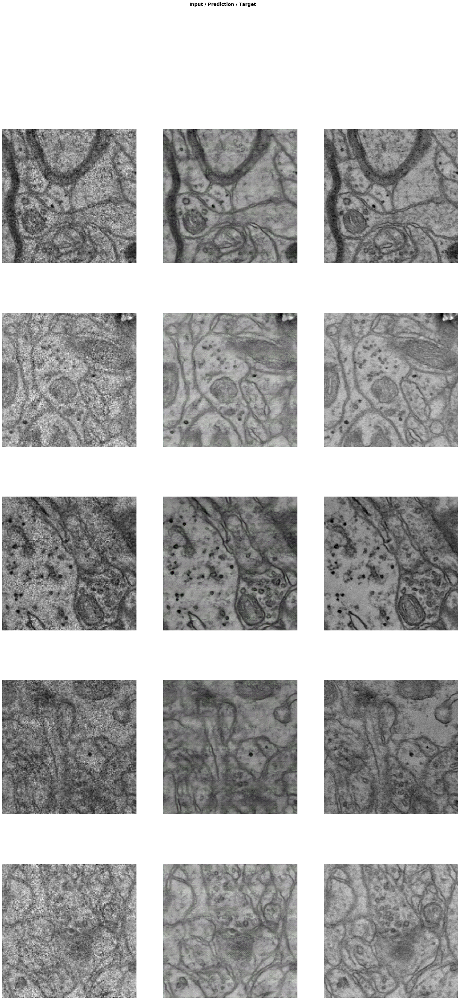

In [33]:
learn.show_results(rows=5, figsize=(25, int(25*2)))